In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
from image_restoration.corruption.ocean import *
from image_restoration.common import ASSETS_DIR

In [3]:
def load_image(name: str, M=1024, N=1024):
    image = Image.open(ASSETS_DIR / name).convert('RGB')
    image = image.resize((M, N))
    image = torch.tensor(np.array(image)) / 255.0
    return image

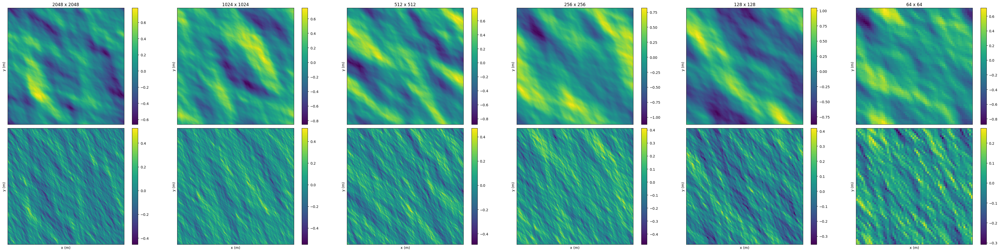

In [4]:
M = 1024 # resolution
N = 1024
Lx = 64 # patch size (m)
Lz = 64
wind = torch.tensor([5, 5]).float() # wind vector (m/s)
wind_alignment = 6
wave_dampening = 0.05
wave_amplitude = 256
t = 0 # time
resolutions = [2048, 1024, 512, 256, 128, 64]

plt.figure(figsize=(40, 10))

# patch_min =  np.inf
# patch_max = -np.inf
# grads_min =  np.inf
# grads_max = -np.inf

for i, res in enumerate(resolutions):
    patch = generate_ocean_patch(Lx, Lz, res, res, wind, t, wind_alignment=wind_alignment, wave_dampening=wave_dampening, wave_amplitude=wave_amplitude)
    plt.subplot(2, len(resolutions), i + 1)
    plt.imshow(patch.height.numpy(), extent=[0, Lx, 0, Lz], origin='lower', cmap='viridis')
    plt.title(f'{res} x {res}')
    plt.ylabel('y (m)')
    plt.xticks([])
    plt.yticks([])
    plt.colorbar()
    
    grads = patch.metadata['height_grad'][..., 0].numpy()
    plt.subplot(2, len(resolutions), i + len(resolutions) + 1)
    plt.imshow(grads, extent=[0, Lx, 0, Lz], origin='lower', cmap='viridis')
    plt.xlabel('x (m)')
    plt.ylabel('y (m)')
    plt.xticks([])
    plt.yticks([])
    plt.colorbar()

    # patch_min = min(patch_min, patch.height.min().item())
    # patch_max = max(patch_max, patch.height.max().item())
    # grads_min = min(grads_min, grads.min())
    # grads_max = max(grads_max, grads.max())

plt.tight_layout()  # Increase space between rows with h_pad
plt.show()

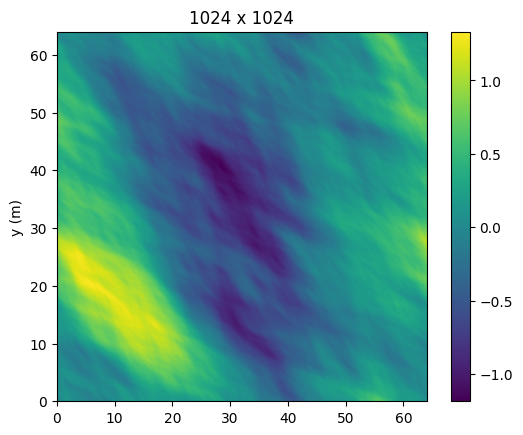

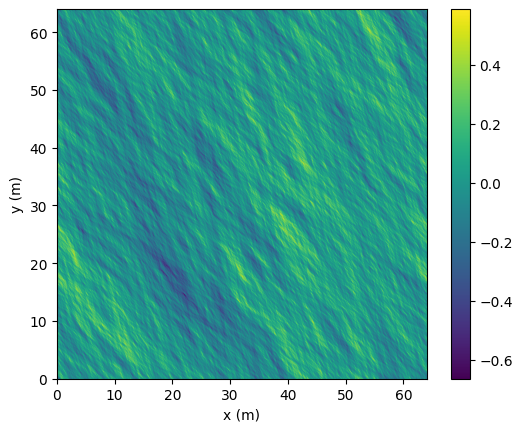

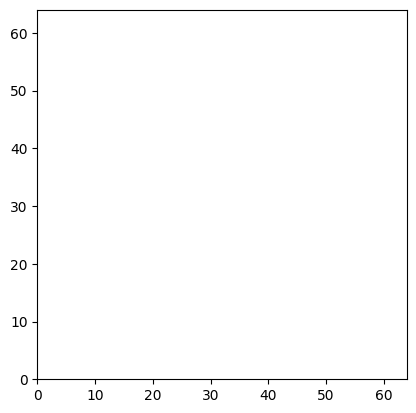

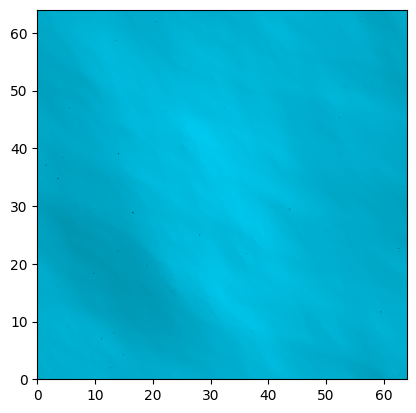

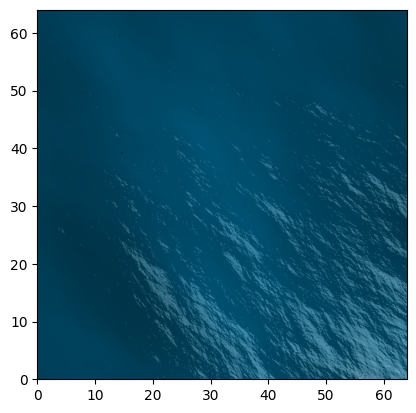

In [14]:
M = 1024
N = 1024
Lx = 64
Lz = 64
wind = torch.tensor([10, 10]).float()
patch = generate_ocean_patch(Lx, Lz, M, N, wind, t=0, wind_alignment=6, wave_dampening=0.01, wave_amplitude=256)

plt.imshow(patch.height.numpy(), extent=[0, Lx, 0, Lz], origin='lower', cmap='viridis')
plt.title(f'{M} x {N}')
plt.ylabel('y (m)')
plt.colorbar()
plt.show()

grads = patch.metadata['height_grad'][..., 0].numpy()
plt.imshow(grads, extent=[0, Lx, 0, Lz], origin='lower', cmap='viridis')
plt.xlabel('x (m)')
plt.ylabel('y (m)')
plt.colorbar()
plt.show()


image = load_image('grid.jpg')
H, W = image.shape[:2]
image = torch.ones((H, W, 3))
depth = torch.full((N, M), 2.5)
light = torch.tensor([1.00, -1.00, 1.00])
light = light / torch.norm(light) * 2.0 # intensity
light_ambient = 0.1
light_scatter = 0.1
light_specular_mult = 0.9
light_specular_gain = 5.0
device = 'cuda'

image_bottom = generate_ocean_bottom_lightmap(
    patch,
    image,
    depth,
    light,
    light_ambient=light_ambient,
    light_scatter=light_scatter, 
    device=device
)
image_corrupted = apply_corruption_ocean(
    patch,
    image,
    depth,
    light,
    light_ambient=light_ambient,
    light_scatter=light_scatter,
    light_specular_mult=light_specular_mult,
    light_specular_gain=light_specular_gain,
    device=device
)

plt.imshow(image                        , extent=[0, Lx, 0, Lz], origin='lower')
plt.show()
plt.imshow(image_bottom   .cpu().numpy(), extent=[0, Lx, 0, Lz], origin='lower')
plt.show()
plt.imshow(image_corrupted.cpu().numpy(), extent=[0, Lx, 0, Lz], origin='lower')
plt.show()

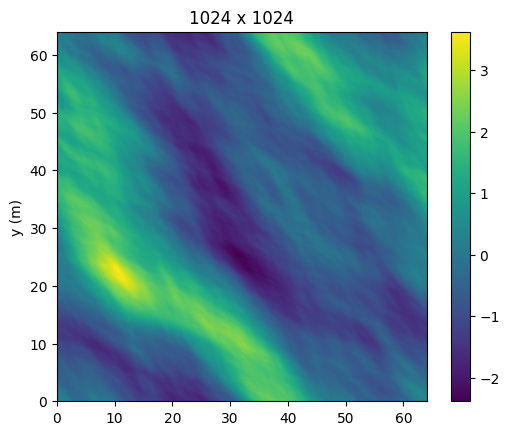

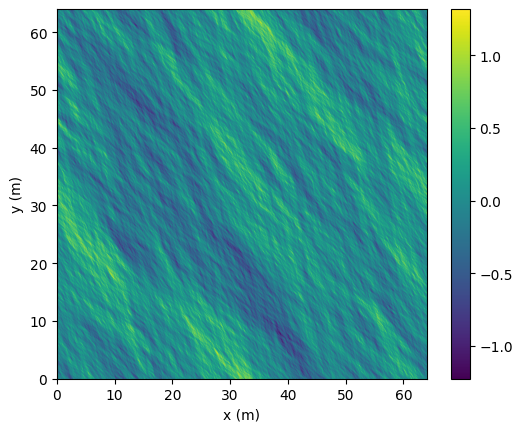

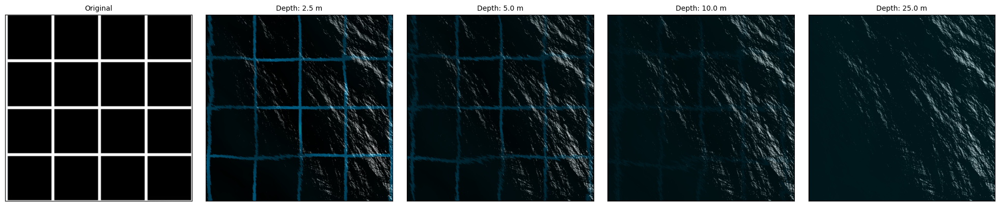

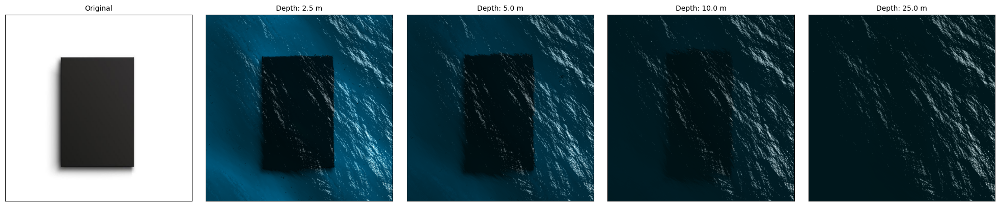

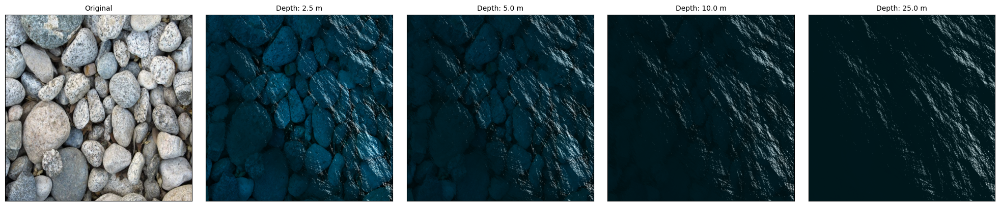

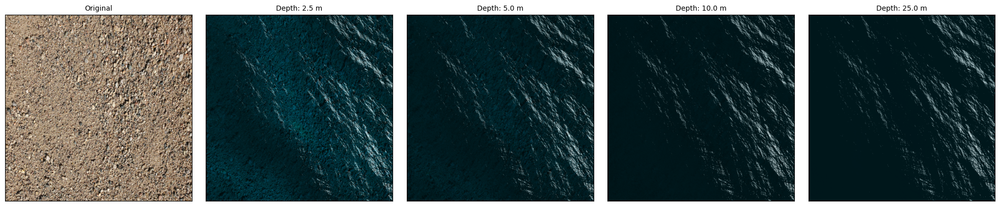

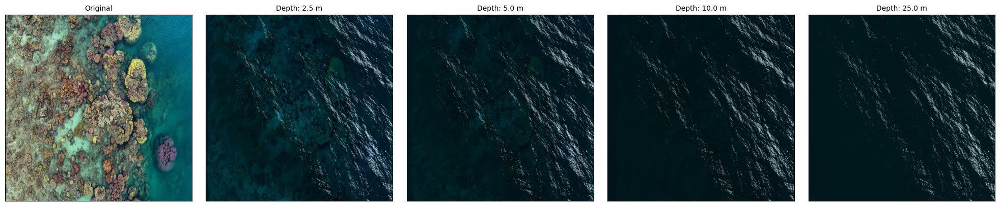

In [15]:
M = 1024
N = 1024
Lx = 64
Lz = 64
wind = torch.tensor([10, 10]).float()
patch = generate_ocean_patch(Lx, Lz, M, N, wind, t=0, wind_alignment=6, wave_dampening=0.01, wave_amplitude=1024)
light = torch.tensor([3.00, -1.00, 1.00])
light = light / torch.norm(light) * 2.0 # intensity
light_ambient = 0.2
light_scatter = 0.1
light_specular_mult = 0.9
light_specular_gain = 10.0
device = 'cuda'

plt.imshow(patch.height.numpy(), extent=[0, Lx, 0, Lz], origin='lower', cmap='viridis')
plt.title(f'{M} x {N}')
plt.ylabel('y (m)')
plt.colorbar()
plt.show()

grads = patch.metadata['height_grad'][..., 0].numpy()
plt.imshow(grads, extent=[0, Lx, 0, Lz], origin='lower', cmap='viridis')
plt.xlabel('x (m)')
plt.ylabel('y (m)')
plt.colorbar()
plt.show()


DEPTH_VALUES = [2.5, 5.0, 10.0, 25.0]

for name in ['grid.jpg', 'box.jpg', 'pebbles.jpg', 'sand.jpg', 'coral.jpg']:
    image = load_image(name)
    image_corrupted_list = []
    for depth_value in DEPTH_VALUES:
        depth = torch.full((M, N), depth_value)
        image_corrupted = apply_corruption_ocean(
            patch, 
            image, 
            depth, 
            light, 
            light_ambient=light_ambient,
            light_scatter=light_scatter,
            light_specular_mult=light_specular_mult,
            light_specular_gain=light_specular_gain,
            device=device
        )
        image_corrupted = image_corrupted.cpu().numpy()
        image_corrupted_list.append(image_corrupted)
    plt.figure(figsize=(20, 10))
    plt.subplot(1, (len(image_corrupted_list) + 1), 1)
    plt.imshow(image, extent=[0, Lx, 0, Lz], origin='lower')
    plt.title('Original', fontsize=10)
    plt.xticks([])
    plt.yticks([])
    for i, image_corrupted in enumerate(image_corrupted_list):
        plt.subplot(1, (len(image_corrupted_list) + 1), i + 2)
        plt.imshow(image_corrupted, extent=[0, Lx, 0, Lz], origin='lower')
        plt.title(f'Depth: {DEPTH_VALUES[i]} m', fontsize=10)
        plt.xticks([])
        plt.yticks([])
    #plt.suptitle(name)
    plt.tight_layout(pad=2.0)
    plt.show()

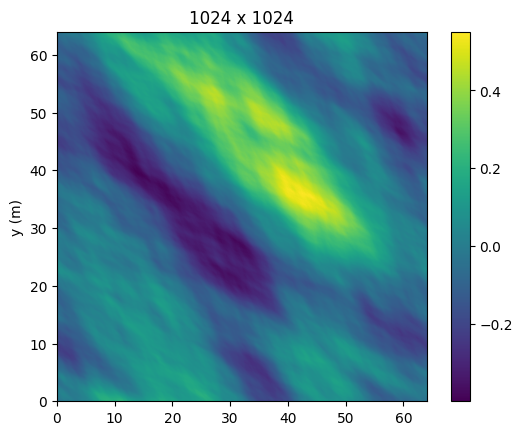

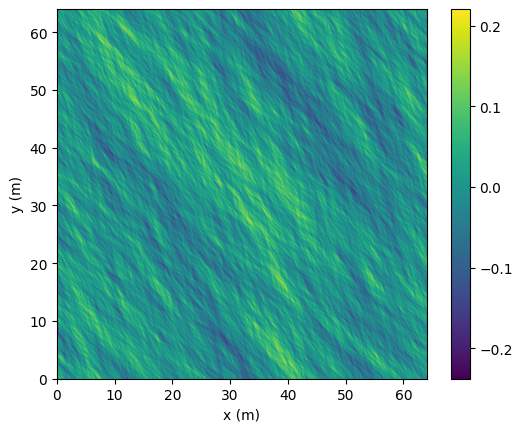

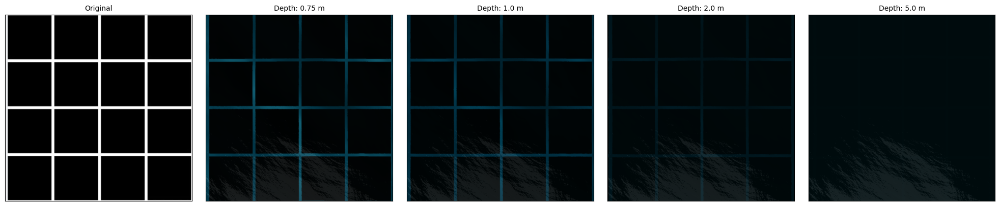

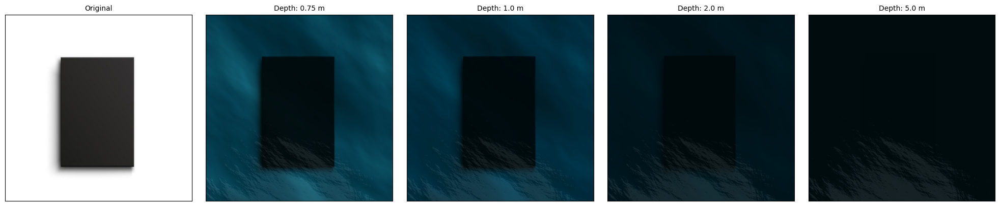

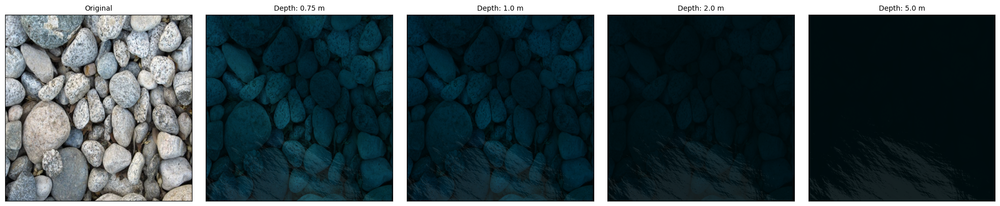

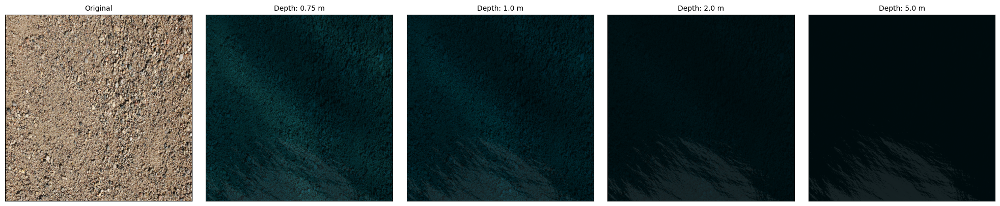

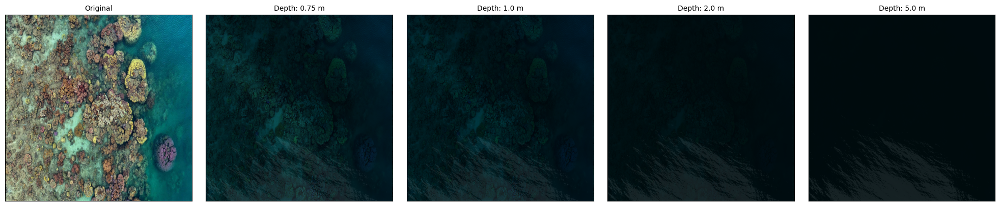

In [20]:
M = 1024
N = 1024
Lx = 64
Lz = 64
wind = torch.tensor([10, 10]).float()
patch = generate_ocean_patch(Lx, Lz, M, N, wind, t=0, wind_alignment=6, wave_dampening=1e-5, wave_amplitude=32)
light = torch.tensor([0.00, -1.00, 1.00])
light = light / torch.norm(light) * 2.0 # intensity
light_ambient = 0.1
light_scatter = 0.5
light_specular_mult = 0.9
light_specular_gain = 2.0
device = 'cuda'

plt.imshow(patch.height.numpy(), extent=[0, Lx, 0, Lz], origin='lower', cmap='viridis')
plt.title(f'{M} x {N}')
plt.ylabel('y (m)')
plt.colorbar()
plt.show()

grads = patch.metadata['height_grad'][..., 0].numpy()
plt.imshow(grads, extent=[0, Lx, 0, Lz], origin='lower', cmap='viridis')
plt.xlabel('x (m)')
plt.ylabel('y (m)')
plt.colorbar()
plt.show()


DEPTH_VALUES = [0.75, 1.0, 2.0, 5.0]

for name in ['grid.jpg', 'box.jpg', 'pebbles.jpg', 'sand.jpg', 'coral.jpg']:
    image = load_image(name)
    image_corrupted_list = []
    for depth_value in DEPTH_VALUES:
        depth = torch.full((M, N), depth_value)
        image_corrupted = apply_corruption_ocean(
            patch, 
            image, 
            depth, 
            light, 
            light_ambient=light_ambient,
            light_scatter=light_scatter,
            light_specular_mult=light_specular_mult,
            light_specular_gain=light_specular_gain,
            device=device
        )
        image_corrupted = image_corrupted.cpu().numpy()
        image_corrupted_list.append(image_corrupted)
    plt.figure(figsize=(20, 10))
    plt.subplot(1, (len(image_corrupted_list) + 1), 1)
    plt.imshow(image, extent=[0, Lx, 0, Lz], origin='lower')
    plt.title('Original', fontsize=10)
    plt.xticks([])
    plt.yticks([])
    for i, image_corrupted in enumerate(image_corrupted_list):
        plt.subplot(1, (len(image_corrupted_list) + 1), i + 2)
        plt.imshow(image_corrupted, extent=[0, Lx, 0, Lz], origin='lower')
        plt.title(f'Depth: {DEPTH_VALUES[i]} m', fontsize=10)
        plt.xticks([])
        plt.yticks([])
    #plt.suptitle(name)
    plt.tight_layout(pad=2.0)
    plt.show()

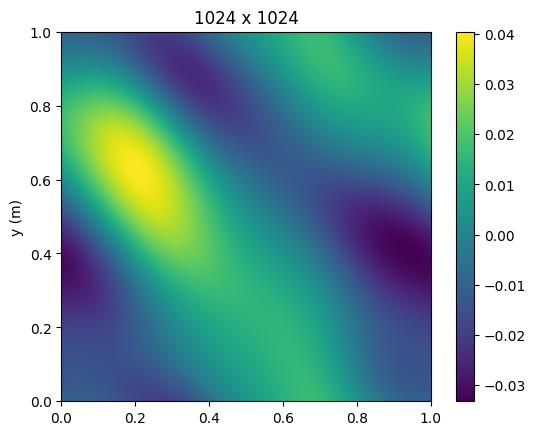

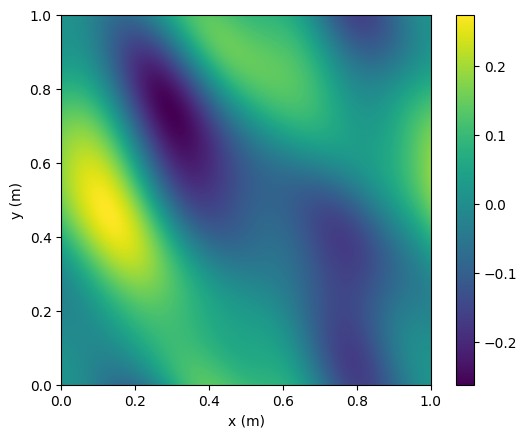

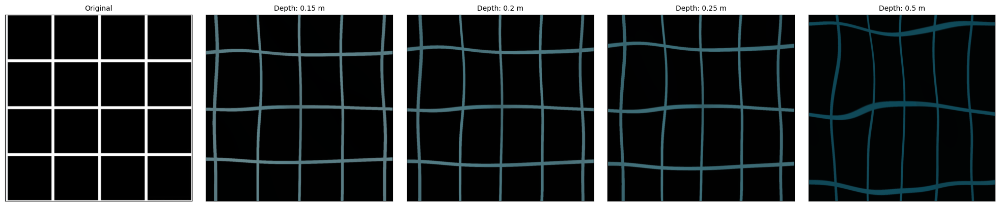

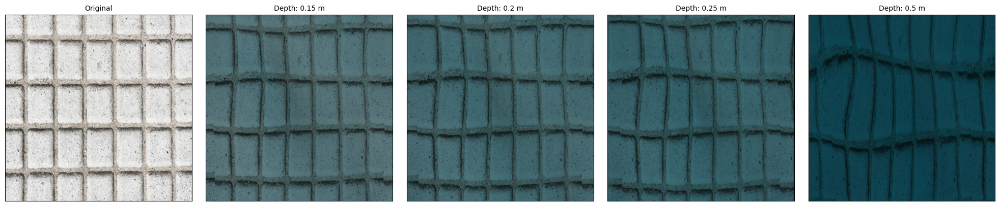

In [17]:
M = 1024
N = 1024
Lx = 1
Lz = 1
wind = torch.tensor([1, 1]).float()
patch = generate_ocean_patch(Lx, Lz, M, N, wind, t=0, wind_alignment=6, wave_dampening=0.1, wave_amplitude=2)
light = torch.tensor([2.00, -1.00, -1.00])
light = light / torch.norm(light) * 2.0 # intensity
light_ambient = 0.1
light_scatter = 0.5
light_specular_mult = 0.975
light_specular_gain = 0.5
device = 'cuda'


plt.imshow(patch.height.numpy(), extent=[0, Lx, 0, Lz], origin='lower', cmap='viridis')
plt.title(f'{M} x {N}')
plt.ylabel('y (m)')
plt.colorbar()
plt.show()

grads = patch.metadata['height_grad'][..., 0].numpy()
plt.imshow(grads, extent=[0, Lx, 0, Lz], origin='lower', cmap='viridis')
plt.xlabel('x (m)')
plt.ylabel('y (m)')
plt.colorbar()
plt.show()


DEPTH_VALUES = [0.15, 0.20, 0.25, 0.50]

for name in ['grid.jpg', 'tiles.jpg']:
    image = load_image(name)
    image_corrupted_list = []
    for depth_value in DEPTH_VALUES:
        depth = torch.full((M, N), depth_value)
        image_corrupted = apply_corruption_ocean(
            patch, 
            image, 
            depth, 
            light, 
            light_ambient=light_ambient,
            light_scatter=light_scatter,
            light_specular_mult=light_specular_mult,
            light_specular_gain=light_specular_gain,
            device=device
        )
        image_corrupted = image_corrupted.cpu().numpy()
        image_corrupted_list.append(image_corrupted)
    plt.figure(figsize=(20, 10))
    plt.subplot(1, (len(image_corrupted_list) + 1), 1)
    plt.imshow(image, extent=[0, Lx, 0, Lz], origin='lower')
    plt.title('Original', fontsize=10)
    plt.xticks([])
    plt.yticks([])
    for i, image_corrupted in enumerate(image_corrupted_list):
        plt.subplot(1, (len(image_corrupted_list) + 1), i + 2)
        plt.imshow(image_corrupted, extent=[0, Lx, 0, Lz], origin='lower')
        plt.title(f'Depth: {DEPTH_VALUES[i]} m', fontsize=10)
        plt.xticks([])
        plt.yticks([])
    #plt.suptitle(name)
    plt.tight_layout(pad=2.0)
    plt.show()